In [ ]:
pip install git+https://github.com/faustrp/fibermagic.git

## Fiber Photometry using Neurophotometrics devices

There are a bunch of different photometry systems out there like TDT systems, Neurophotometrics or open-hardware approaches. In this tutorial, we will use data from Neurophotometrics as an example.

![grafik.png](attachment:grafik.png)

## Multiple Colors

With Neurophotometrics (NPM), it is possible to capture data from two fluorescent sensors simultaneously - if they emit light in different wave lengths. NPM can measure light of two different color spectra: Red and Green. Using this technology, it is possible, to e.g. express a green calcium sensor (e.g. GCaMP6f) and a red dopamine sensor (e.g. Rdlight1).

![grafik.png](attachment:grafik.png)
grafik source: https://www.researchgate.net/publication/264796291_Bright_and_fast_multi-colored_voltage_reporters_via_electrochromic_FRET/figures?lo=1

# Fibermagic Tutorial

Fibermagic is an open-source software package for the analysis of photometry data. It is written in Python and operates on pandas and numpy dataframes.

Fiber Photometry is a novel technique to capture neural activity in-vivo with a subsecond temporal precision. Genetically encoded fluorescent sensors are expressed by either transfection with an (AAV)-virus or transgenic expression. Strength of fluorescence is dependent on the concentration of the neurotransmitter the sensor detects. Using an optic glass fiber, it is possible to image neural dynamics and transmitter release.

![grafik.png](attachment:grafik.png)
graphik source: https://en.wikipedia.org/wiki/Fiber_photometry

## Multiple Mice

NPM can record data from multiple mice at once - delivered through a single patch chord that splits into several small cables that can be attached individually to a single mouse.

The end of the patch chord connects to an implant (usually a fiber optic cannula) which captures the light. Here's how it looks like:

![grafik.png](attachment:grafik.png)

Before starting the recording, the researcher defines a region of interest for each cable and color. Then, NPM captures the light intensity for each region of interest seperately. All data streams are written into one single csv file per recording.

In [1]:
import os
print(os.getcwd())

/home/jam/Gits/fibermagic-notebooks


## Investigating a single raw data file

Let's have a look into an arbitrary recording file and try to understand the data.

In [2]:
#!pip install pandas
import pandas as pd

In [3]:
# logs = pd.read_csv('raw data/07-25-2024/B7177,B7178-PR11/logs.csv')
# logs.columns = ['ComputerTimestamp', 'SystemTimestamp', 'animal.ID', 'Event', 'pi.time', 'pc.time', 'datetimestamp']
# logs = logs[logs['animal.ID']=='B7178']
# #logs.Schedule='PR11'
# logs

basepath = '/home/jam/Downloads/NAcC gDA3m + rAdo1.3 FR20-PR/DATA/PR5/'
# expdate = '05-29-2023'
id = 'B1757'
fullpath = basepath + id + '/' + 'logs.csv'
print(fullpath)
logs = pd.read_csv(fullpath)
logs.columns = ['ComputerTimestamp', 'SystemTimestamp', 'animal.ID', 'Event', 'pi.time', 'pc.time', 'datetimestamp']
logs = logs[logs['animal.ID']==id]
#logs.Schedule='PR11'
print(logs)

/home/jam/Downloads/NAcC gDA3m + rAdo1.3 FR20-PR/DATA/PR5/B1757/logs.csv
      ComputerTimestamp  SystemTimestamp animal.ID        Event       pi.time  \
99         5.709379e+07      3106.725760     B1757  video_start -1.000000e+00   
114        5.711424e+07      3127.169856     B1757           RL  1.707289e+09   
117        5.711513e+07      3128.059840     B1757           RL  1.707289e+09   
120        5.711606e+07      3128.993856     B1757           RL  1.707289e+09   
123        5.711984e+07      3132.767872     B1757           BM  1.707289e+09   
...                 ...              ...       ...          ...           ...   
2369       5.978533e+07      5797.962272     B1757           RL  1.707292e+09   
2370       5.979233e+07      5804.966304     B1757           RL  1.707292e+09   
2371       5.979287e+07      5805.506304     B1757           RL  1.707292e+09   
2372       5.979352e+07      5806.148352     B1757           RL  1.707292e+09   
2373       5.979413e+07      5806.76

In [4]:
fullpath = basepath + id + '/' + 'photometry.csv'
df = pd.read_csv(fullpath)
df = df.rename(columns={'R0':'Region0R','G1':'Region1G'})
#df = df.rename(columns={'SystemTimestamp':'Timestamp'})
df = df.rename(columns={'Timestamp':'SystemTimestamp'})
df = df[df.SystemTimestamp>=logs.iloc[0]['SystemTimestamp']]
df

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G
2976,2976,3106.735968,2,5.709382e+07,0.012057,0.057715
2977,2977,3106.769280,4,5.709386e+07,0.034164,0.884977
2978,2978,3106.802624,1,5.709389e+07,0.017435,0.067111
2979,2979,3106.835968,2,5.709392e+07,0.011962,0.056999
2980,2980,3106.869280,4,5.709396e+07,0.034258,0.884798
...,...,...,...,...,...,...
84811,84811,5834.474976,4,5.982153e+07,0.025157,0.885225
84812,84812,5834.508288,1,5.982156e+07,0.016276,0.059847
84813,84813,5834.541632,2,5.982159e+07,0.009682,0.052431
84814,84814,5834.574976,4,5.982163e+07,0.025156,0.884869


Each Region of Interest is represented as one column. 

A simple frame counter and a timestamp indicate when a measurement happened.

The LEDState column encodes which LED was on at the time of measurement.

Because the action spectra of fluorescent proteins often overlap, multicolor photometry requires a method of separating the different fluorescence signals. The NPM system uses time-division multiplexing, in which only one of the three different colored excitation LEDs is active at a time.

![grafik.png](attachment:grafik.png)

We can use fibermagic to decode which LEDs were on at what measurement from the LEDState column.

In [5]:
#!pip install fibermagic
from fibermagic.IO.NeurophotometricsIO import extract_leds

/home/jam/mambaforge/envs/cfiber/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
if 'Flags' in df.columns:  # legacy fix: Flags were renamed to LedState
    df = df.rename(columns={'Flags': 'LedState'})
df = extract_leds(df).dropna()
df.head(10)

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G,wave_len
2976,2976,3106.735968,2,5.709382e+07,0.012057,0.057715,470.0
2977,2977,3106.769280,4,5.709386e+07,0.034164,0.884977,560.0
2978,2978,3106.802624,1,5.709389e+07,0.017435,0.067111,410.0
2979,2979,3106.835968,2,5.709392e+07,0.011962,0.056999,470.0
2980,2980,3106.869280,4,5.709396e+07,0.034258,0.884798,560.0
2981,2981,3106.902624,1,5.709399e+07,0.017463,0.067366,410.0
2982,2982,3106.935968,2,5.709402e+07,0.012000,0.057596,470.0
2983,2983,3106.969280,4,5.709406e+07,0.034529,0.884985,560.0
2984,2984,3107.002624,1,5.709409e+07,0.017413,0.067156,410.0
2985,2985,3107.035968,2,5.709412e+07,0.012029,0.057691,470.0


Now, we have all we need to plot the full trace of a single sensor of one mouse and inspect the raw data values. In this recording, Rdlight1 and GCaMP6f were expressed. Rdlight1 is excited by the 560 nm LED and emits light in the red color spectrum. GCaMP6f is excited by the 470 nm LED and emits light in the green spectrum. Now, let's spike into the raw data of Rdlight1 of a single mouse.

We use "plotly" for plotting here. Plotly is a plotting library for Python and other programming languages. It is interactive, which means we can zoom in and out and scroll through the data, which is exactly what we want to do at the moment.

In [7]:
import plotly.express as px
region0R_red = df[df.wave_len == 560][['FrameCounter', 'Region0R']]
px.line(region0R_red, x='FrameCounter', y='Region0R')

In [9]:
region0R_iso = df[df.wave_len == 410][['FrameCounter', 'Region0R']]
px.line(region0R_iso, x='FrameCounter', y='Region0R')

In [10]:
import numpy as np
#region0R_iso.drop(region0R_iso.tail(1).index, inplace=True)
referenceR=region0R_iso.Region0R.to_numpy()
#region0R_red.drop(region0R_red.head(1).index, inplace=True)
# region0R_red.drop(region0R_red.tail(1).index, inplace=True)
signalR=region0R_red.Region0R.to_numpy()
z_referenceR = (referenceR - np.median(referenceR)) / np.std(referenceR)
z_signalR = (signalR - np.median(signalR)) / np.std(signalR)

In [11]:
from sklearn.linear_model import Lasso
lin = Lasso(alpha=0.0001,precompute=True,max_iter=1000,
            positive=True, random_state=9999, selection='random')
n = len(z_referenceR)
lin.fit(z_referenceR.reshape(n,1), z_signalR.reshape(n,1))

Lasso(alpha=0.0001, positive=True, precompute=True, random_state=9999,
      selection='random')

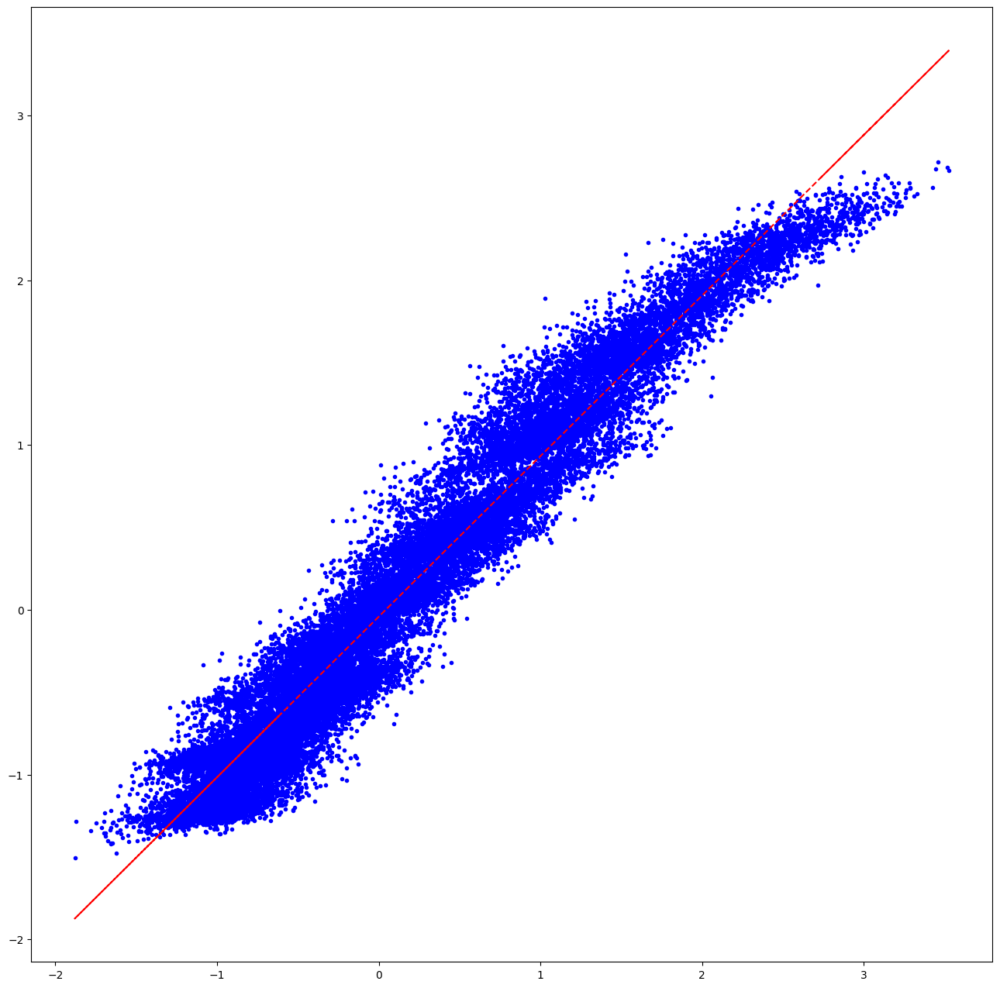

In [12]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(111)
ax1.plot(z_referenceR,z_signalR,'b.')
z_referenceR_fitted = lin.predict(z_referenceR.reshape(n,1)).reshape(n,)
ax1.plot(z_referenceR,z_referenceR_fitted, 'r--',linewidth=1.5)

In [13]:
region1G_green = df[df.wave_len == 470][['FrameCounter', 'Region1G']]
px.line(region1G_green, x='FrameCounter', y='Region1G')

In [14]:
region1G_iso = df[df.wave_len == 410][['FrameCounter', 'Region1G']]
px.line(region1G_iso, x='FrameCounter', y='Region1G')

In [15]:
#region1G_iso.drop(region1G_iso.tail(1).index, inplace=True)
referenceG=region1G_iso.Region1G.to_numpy()
# region1G_green.drop(region1G_green.tail(1).index, inplace=True)
signalG=region1G_green.Region1G.to_numpy()
z_referenceG = (referenceG - np.median(referenceG)) / np.std(referenceG)
z_signalG = (signalG - np.median(signalG)) / np.std(signalG)

In [16]:
from sklearn.linear_model import Lasso
lin = Lasso(alpha=0.0001,precompute=True,max_iter=1000,
            positive=True, random_state=9999, selection='random')
n = len(z_referenceG)
lin.fit(z_referenceG.reshape(n,1), z_signalG.reshape(n,1))

Lasso(alpha=0.0001, positive=True, precompute=True, random_state=9999,
      selection='random')

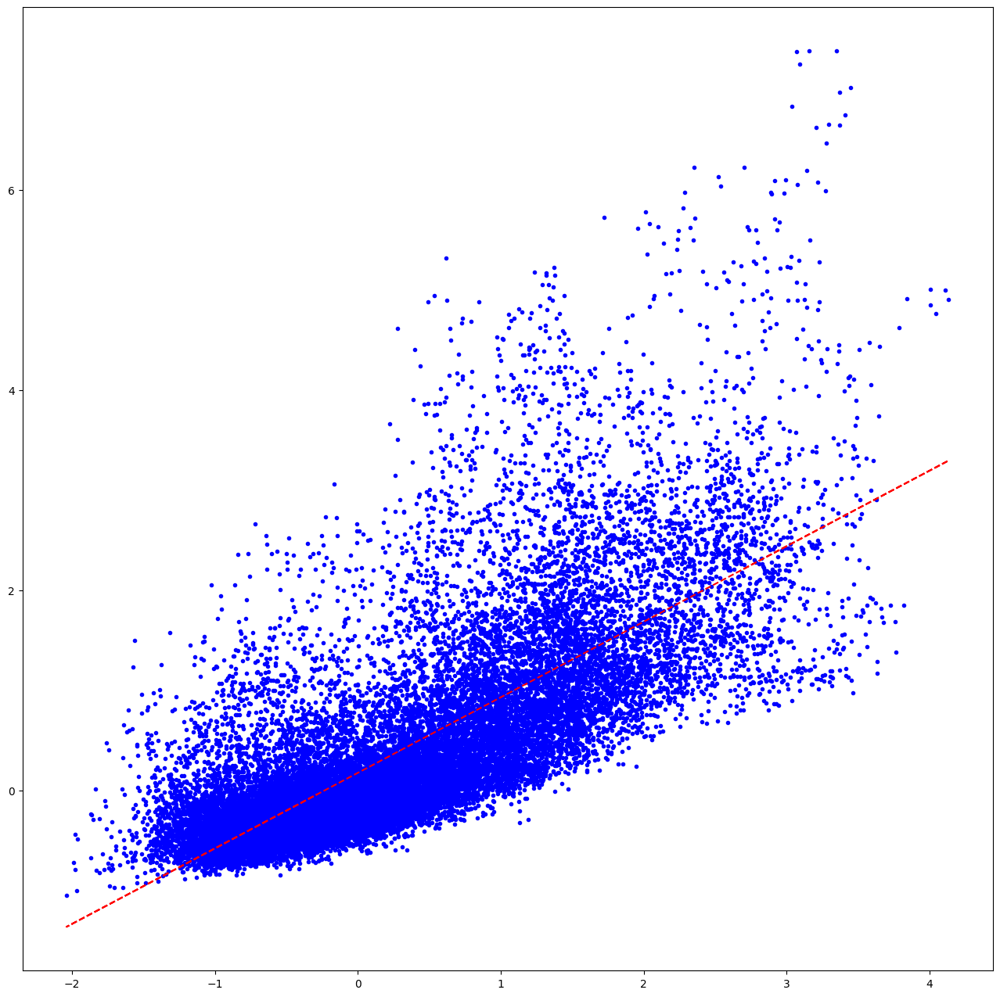

In [17]:
fig = plt.figure(figsize=(16, 16))
ax1 = fig.add_subplot(111)
ax1.plot(z_referenceG,z_signalG,'b.')
z_referenceG_fitted = lin.predict(z_referenceG.reshape(n,1)).reshape(n,)
ax1.plot(z_referenceG,z_referenceG_fitted, 'r--',linewidth=1.5)
#ax1.set_xlim(-1,3)
#ax1.set_ylim(-1,2)

We can clearly see huge transients from dopamine activity in the raw data. Congratulations!

However, there are several issues with the data. Fiber Photometry does not measure the difference between day and night. Changes in fluorescence are usually extremely small and very hard to measure. We basically measure light intensity with a super high precision. However, this means that the photometry system will also pick up every disturbance, even if very small.

Examples of unwanted noise are:
* Photobleaching of the Patch Chord
* Photobleaching caused by LED heating
* Photobleaching caused by destroyment of sensors
* Motion artifacts
* Loose, poorly attached, and/or twisted cables

![grafik.png](attachment:grafik.png)

## Demodulation of Fiber Photometry Data

As we saw, the raw data is useless without further processing. There are a variety of different of different methods to remove photobleaching and motion artifacts, here are a few examples:

### Correction of Photobleaching:

* High-Pass Filtering: Photobleaching usually occurs at a very slow timescale. By applying a simple high-pass filter, e.g. a butterworth, it is possible to remove the gross artifacts of photobleaching, but it removes also slow changes in neurotransmitter concentration
* Biexponential decay: Photobleaching can be estimated by a decreasing exponential function. However, as it happens on two different timescales (e.g. fast LED-heating-based photobleaching and slow patch chord photobleaching), we need a biexponential decay that can be regressed to the data and then subtracted.
* airPLS: Adaptive iteratively reweighted penalized least squares. A more advanced method to remove artifacts. For more info, please see the paper: DOI: 10.1039/b922045c

### Correction of Motion Artifacts:

* Genetically encoded Neurotransmitter indicators have usually a useful attribute: If stimulated at around 410 nm (instead of e.g. 470 or 560), the emission will be the same independent of the neurotransmitter concentration. Stimulating a this wave length is called recording an "isobestic". The isobestic is usefull to correct motion artifacts.
* If a transient is caused by neural activity, it should be detectable in the signal channel, but if it is caused by motion, it should be detectable in both, the isobestic and signal.
* We can remove motion artifacts if we fit the isobestic to the signal and subtract.

## Demodulate using airPLS

We can use fibermagic to calculate z-scores of dF/F using the airPLS algorithm. However, before we do that, we need to bring the dataframe into long-format.

In [18]:
df.head(10)

,FrameCounter,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G,wave_len
2976,2976,3106.735968,2,5.709382e+07,0.012057,0.057715,470.0
2977,2977,3106.769280,4,5.709386e+07,0.034164,0.884977,560.0
2978,2978,3106.802624,1,5.709389e+07,0.017435,0.067111,410.0
2979,2979,3106.835968,2,5.709392e+07,0.011962,0.056999,470.0
2980,2980,3106.869280,4,5.709396e+07,0.034258,0.884798,560.0
2981,2981,3106.902624,1,5.709399e+07,0.017463,0.067366,410.0
2982,2982,3106.935968,2,5.709402e+07,0.012000,0.057596,470.0
2983,2983,3106.969280,4,5.709406e+07,0.034529,0.884985,560.0
2984,2984,3107.002624,1,5.709409e+07,0.017413,0.067156,410.0
2985,2985,3107.035968,2,5.709412e+07,0.012029,0.057691,470.0


In [19]:
NPM_RED = 560
NPM_GREEN = 470
NPM_ISO = 410
# dirty hack to come around dropped frames until we find better solution -
# it makes about 0.16 s difference
#df = df.iloc[0:]
df.FrameCounter = np.arange(0, len(df)) // len(df.wave_len.unique())
df = df.set_index('FrameCounter')
df.head(5)

,SystemTimestamp,LedState,ComputerTimestamp,Region0R,Region1G,wave_len
FrameCounter,,,,,,
0,3106.735968,2,5.709382e+07,0.012057,0.057715,470.0
0,3106.769280,4,5.709386e+07,0.034164,0.884977,560.0
0,3106.802624,1,5.709389e+07,0.017435,0.067111,410.0
1,3106.835968,2,5.709392e+07,0.011962,0.056999,470.0
1,3106.869280,4,5.709396e+07,0.034258,0.884798,560.0


In [20]:
# Convert to long format
regions = [column for column in df.columns if 'Region' in column]
dfs = list()
for region in regions:
    channel = NPM_GREEN if 'G' in region else NPM_RED
    sdf = pd.DataFrame(data={
        'Region': region,
        'Channel': channel,
        'Timestamp': df.SystemTimestamp[df.wave_len == channel],
        'Signal': df[region][df.wave_len == channel],
        'Reference': df[region][df.wave_len == NPM_ISO]
    }
    )
    dfs.append(sdf)
dfs = pd.concat(dfs).reset_index().set_index('Region').dropna()
dfs

,FrameCounter,Channel,Timestamp,Signal,Reference
Region,,,,,
Region0R,0,560,3106.769280,0.034164,0.017435
Region0R,1,560,3106.869280,0.034258,0.017463
Region0R,2,560,3106.969280,0.034529,0.017413
Region0R,3,560,3107.069280,0.034421,0.017450
Region0R,4,560,3107.169280,0.034129,0.017339
...,...,...,...,...,...
Region1G,27275,470,5834.141632,0.053885,0.059953
Region1G,27276,470,5834.241632,0.053487,0.060039
Region1G,27277,470,5834.341632,0.053180,0.059790


In [21]:
dfs2 = dfs

In [22]:
from functools import partial

import numpy as np
import pandas as pd
from scipy.optimize import curve_fit
from sklearn.linear_model import Lasso
from scipy.sparse import csc_matrix, eye, diags
from scipy.sparse.linalg import spsolve

from tqdm.auto import tqdm

tqdm.pandas()


def demodulate(
    data=None,
    timestamps=None,
    signal=None,
    isosbestic=None,
    by=None,
    steps=False,
    method="airPLS",
    smooth=None,
    standardize=False,
    **kwargs
):
    """
    High-level function to demodulate signal

    Supports two methods for baseline correction: airPLS and biexponential decay.

    If isosbestic is given, performs artifact removal using the isosbestic signal

    Parameters
    ----------
    data : pd.DataFrame or dict
        raw data to demodulate, if None, timestamps, signal and isosbestic must be provided as array-like
    timestamps : str or array-like
        the array with timestamps; if str, it is the name of the column in data
        the column with timestamps or the timestamps themselves
    signal : str or array-like
        the column with signal; if str, it is the name of the column in data
        the column with signal or the signal itself
    isosbestic : str or array-like
        the column with isosbestic signal; if str, it is the name of the column
        in data the column with isosbestic signal or the isosbestic signal itself
    by : str or list
        with column names to group by or array-like with group labels, has to be the same length as
        the data
        divides the data into groups and demodulates each group separately, typically you should pass enough
        columns to uniquely identify each session
    steps : bool
        if True, returns intermediate steps as a pd.DataFrame
    method : str
        method to use for demodulation, one of [airPLS, biexponential decay] or None if only artifact removal
        is needed
    smooth : int or None
        length of the smoothing moving average window; used to smooth the signal and isosbestic before demodulation
    standardize: bool
        if True, calculates z-scores from the dFF after demodulation and artifact removal
    kwargs : dict
        parameters for airPLS or biexponential decay.

        For airPLS:
        lambda: parameter for airPLS; The larger lambda is, the smoother the resulting background
        porder: parameter for airPLS; adaptive iteratively reweighted penalized least squares for baseline fitting
        itermax: parameter for airPLS; maximum number of iterations
        lambda_artifact: parameter for artifact removal; The larger lambda is, the smoother the resulting
        background
        porder_artifact: parameter for artifact removal; adaptive iteratively reweighted penalized least squares
        for
        baseline fitting
        itermax_artifact: parameter for artifact removal; maximum number of iterations

    Returns
    -------
    pd.DataFrame or pd.Series with the demodulated signal

    """

    demodulator = _Demodulator(
        data=data,
        timestamps=timestamps,
        signal=signal,
        isosbestic=isosbestic,
        by=by,
        steps=steps,
        method=method,
        smooth=smooth,
        standardize=standardize,
        **kwargs,
    )

    return demodulator()


class _Demodulator:
    def __init__(
        self,
        data=None,
        timestamps=None,
        signal=None,
        isosbestic=None,
        by=None,
        steps=False,
        method="biexponential decay",
        smooth=None,
        standardize=False,
        **kwargs
    ):

        self.timestamp = timestamps
        self.signal = signal
        self.isosbestic = isosbestic

        # convert input to a common representation
        # check if type of data is a pd.DataFrame
        if not isinstance(data, pd.DataFrame):
            if data:  # then it must be a dict and/or data are provided as an array
                timestamps = data.get(timestamps, timestamps)
                signal = data.get(signal, signal)
                isosbestic = data.get(isosbestic, isosbestic)

                if isinstance(by, str):
                    by_data = data.get(by, by)
                elif isinstance(by, list):
                    by_data = [data.get(x, x) for x in by]

            if any([type(x) == str for x in [timestamps, signal, isosbestic]]):
                raise ValueError("If data is not provided, timestamps, signal and isosbestic must be array-like")
            if by:
                data = pd.DataFrame(
                    {
                        "timestamps": timestamps,
                        "signal": signal,
                        "isosbestic": isosbestic,
                        **dict(zip(by, by_data)),
                    }
                )
            else:
                data = pd.DataFrame({"timestamps": timestamps, "signal": signal, "isosbestic": isosbestic})
        else:
            # check if column names is exists if they are not None
            if type(timestamps) == str and timestamps not in data.columns:
                raise ValueError("timestamps column not found in data")
            else:
                data = data.rename({timestamps: "timestamps"}, axis=1)
            if type(signal) == str and signal not in data.columns:
                raise ValueError("signal column not found in data")
            else:
                data = data.rename({signal: "signal"}, axis=1)
            if type(isosbestic) == str and isosbestic not in data.columns:
                raise ValueError("isosbestic column not found in data")
            else:
                data = data.rename({isosbestic: "isosbestic"}, axis=1)
        # check if by is a string or list of strings, all of which are in data.columns
        if by:
            if type(by) == str:
                if by not in data.columns:
                    raise ValueError("per column not found in data")
            elif type(by) == list:
                if any([x not in data.columns and x not in data.index.names for x in by]):
                    raise ValueError("per column not found in data")
            else:
                by = np.asarray(by)
                # check if len of per is equal to len of data
                if by and len(by) != len(data):
                    raise ValueError("per must be the same length as data")

        self.steps = steps
        self.method = method
        self.data = data

        self.by = by
        if by:
            # count number of unique groups in by columns
            # if only one group, set by to None to not groupby
            n_groups = len(data.groupby(by=by).groups)
            if n_groups == 1:
                self.by = None
        self.smooth = smooth
        self.standardize = standardize

        # set parameters
        self.lambda_ = kwargs.get("lambda", 5e4)
        self.porder = kwargs.get("porder", 1)
        self.itermax = kwargs.get("itermax", 50)

        self.lambda_artifact = kwargs.get("lambda_artifact", 1e4)
        self.porder_artifact = kwargs.get("porder_artifact", 1)
        self.itermax_artifact = kwargs.get("itermax_artifact", 50)

    def __call__(self):
        # select the correct method given the input and run it

        # if method None, only artifact removal
        if not self.method:
            if self.data.isosbestic is None:
                raise ValueError("isosbestic must be provided for artifact removal")
            method = self.remove_artifact

        # if no isosbestic is provided, only demodulate, no artifact removal
        if self.isosbestic is None:
            if self.method == "airPLS":
                method = self.demodulate_with_airPLS
            elif self.method == "biexponential decay":
                method = self.demodulate_with_biexponential_decay
        # if isosbestic is provided, demodulate and remove artifact
        else:
            if self.method == "airPLS":
                method = self.demodulate_with_airPLS_and_remove_artifact
            elif self.method == "biexponential decay":
                method = self.demodulate_with_biexponential_decay_and_remove_artifact

        def smooth(method, data):
            data.signal = data.signal.rolling(self.smooth, center=True, min_periods=1).mean()
            if self.isosbestic:
                data.isosbestic = data.isosbestic.rolling(self.smooth, center=True, min_periods=1).mean()
            return method(data)

        if self.smooth:
            method = partial(smooth, method)

        def z_score(method, data):
            # perform demodulation and artifact removal first
            data = method(data)

            # then, simply calculate z-scores
            if isinstance(data, pd.DataFrame):  # this is the case if steps is True
                data["zdFF"] = (data.dFF - data.dFF.median()) / data.dFF.std()
            else:  # if steps is False, data is a series
                data = (
                    data - data.median()
                ) / data.std()  # use median instead of mean to be robust to big transients
            return data

        if self.standardize:
            method = partial(z_score, method)

        if not self.by:
            return method(self.data)
        # don't sort and return index, because it should be possible to assign the result to the original index
        r = self.data.groupby(self.by, sort=False, as_index=False).progress_apply(method)
        if isinstance(r, pd.DataFrame) and len(r.columns.names) == 1:
            column_name = r.columns.names[0]
            r = r.stack()  # because progress_apply returns a df with one column not a series
            r.name = column_name
        return r.reset_index(level=0, drop=True)

    def demodulate_with_airPLS_and_remove_artifact(self, data):
        """
        Demodulate signal using airPLS and remove artifact

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        result = self.demodulate_with_airPLS(data)
        signal = result["dFF"] if self.steps else result

        # pass demodulated signal to remove artifact on this one, not on the original signal
        result = self.remove_artifact(data, signal)
        return result

    def demodulate_with_biexponential_decay_and_remove_artifact(self, data):
        """
        Demodulate signal using biexponential decay and remove artifacts using isosbestic

        First, dFF is calculated using biexponential decay.

        Then, artifact is removed by aligning, scaling and subtracting isosbestic signal.
        To align isosbestic signal, airPLS is used.

        Parameters
        ----------
        data: pd.DataFrame
            with columns signal and isosbestic

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        result = self.demodulate_with_biexponential_decay(data)
        signal = result["dFF"] if self.steps else result

        # pass demodulated signal to remove artifact on this one, not on the original signal
        result = self.remove_artifact(data, signal)
        return result

    def remove_artifact(self, data, artifact_signal=None):
        """
        Remove artifact from signal by scaling and subtracting isosbestic signal

        Parameters
        ----------
        data: pd.DataFrame with columns signal and isosbestic
        artifact_signal: pd.DataFrame, optional, default: None
            if given, use this signal for artifact removal instead of data.signal

        Returns
        -------
        pd.Series with artifact removed signal or df with intermediate steps as additional columns
        """

        if artifact_signal is None:
            artifact_signal = data.signal

        # test if len of data and artifact_signal are equal
        if len(data) != len(artifact_signal):
            raise ValueError("data and artifact_signal must have the same length")

        data["isosbestic_airPLS_baseline"] = self.airPLS(
            data.isosbestic.to_numpy(),
            lambda_=self.lambda_artifact,
            porder=self.porder_artifact,
            itermax=self.itermax_artifact,
        )
        data["signal_airPLS_baseline"] = self.airPLS(
            artifact_signal.to_numpy(),
            lambda_=self.lambda_artifact,
            porder=self.porder_artifact,
            itermax=self.itermax_artifact,
        )

        data["signal_wo_slope"] = artifact_signal - data.signal_airPLS_baseline
        data["isosbestic_wo_slope"] = data.isosbestic - data.isosbestic_airPLS_baseline

        data["isosbestic_wo_slope"] = (
            data.isosbestic_wo_slope - data.isosbestic_wo_slope.median()
        ) / data.isosbestic_wo_slope.std()

        # Align reference signal to calcium signal using non-negative robust linear regression
        lin = Lasso(
            alpha=0.0001,
            precompute=True,
            max_iter=1000,
            positive=True,
            random_state=9999,
            selection="random",
        )

        # zero-center both signals
        data["isosbestic_centered"] = data.isosbestic_wo_slope - data.isosbestic_wo_slope.median()
        data["signal_centered"] = data.signal_wo_slope - data.signal_wo_slope.median()

        n = len(data.isosbestic_centered)
        lin.fit(data.isosbestic_centered.to_numpy().reshape(n, 1), data.signal_centered.to_numpy().reshape(n, 1))
        data["isosbestic_fit"] = lin.predict(data.isosbestic_centered.to_numpy().reshape(n, 1)).reshape(
            n,
        )

        data["signal_wo_artifacts"] = artifact_signal - data.isosbestic_fit

        if self.steps:
            return data
        return data.signal_wo_artifacts

    def demodulate_with_airPLS(self, data):
        """
        Low-level function to demodulate signal using airPLS; estimates a baseline and calculates dFF
        Parameters
        ----------
        data
            pd.DataFrame with raw signal and timestamps

        Returns
        -------
        pd.Series with demodulated signal or df with intermediate steps as additional columns

        """
        # Remove slope using airPLS algorithm
        data["baseline_fit"] = self.airPLS(data.signal, self.lambda_, self.porder, self.itermax)
        if any(data.baseline_fit <= 0):
            raise ValueError(
                "Negative or zero values in baseline fit, try to decrease lambda_, check if there is "
                "any fluorescence (if your measured values are very close to zero, there might not be)"
            )
            
        data["dFF"] = (data.signal - data.baseline_fit) / data.baseline_fit
        
        #data["dFF"] = data.signal/data.baseline_fit

        if self.steps:
            return data
        return data.dFF

    def demodulate_with_biexponential_decay(self, data):
        """
        Low-level function to demodulate signal using biexponential decay

        Parameters
        ----------
        data: pd.DataFrame
            with raw signal and timestamps

        Returns
        -------
        pd.Series with demodulated signal or df with intermediate steps as additional columns

        """

        def func(x, a, b, c, d, e):
            return a * np.exp(-b * x) + c * np.exp(-d * x) + e

        x = data.timestamps
        y = data.signal
        maxfev = 20000

        # often, long recordings fail to converge with the default parameters
        # but with a good initialization, they converge
        # most recordings should converge with one of the following initializations
        p0_hypotheses = [
            (0.0001444429, 0.0001258, 0.00267557, 0.000357409, 0.00302242),
            (0.0001, 1e-2, 0.0001, 0.0001, 0.01),
            (0.01444429, 0.0001258, 0.00267557, 0.00357409, 0.00302242),
            (2.40565424e-03, 2.17178810e-03, 4.26379890e-02, 5.10966801e-05, -2.27121348e-02),
            (0.00555751, 0.00044251, 0.00192142, 0.00044231, 0.0094028),
            (2.91087378e-02, 9.59886404e-05, 4.50395693e-03, 1.71131354e-03, -3.08947780e-03),
            (0.01943434, 0.00030113, 0.00312723, 0.00311773, 0.01080267),
            (-2.00141250e-11, -4.63104530e-03, 1.12415216e-02, 5.18970857e-04, 1.54544995e-02),
            (0.01258999, 0.000377, 0.00291031, 0.00311715, 0.00720046),
            (0.1, 0.1, 0.1, 0.1, 0.012),
        ]
        for p0_hypothesis in p0_hypotheses:
            popt, pcov = curve_fit(func, x, y, p0=p0_hypothesis, maxfev=maxfev)
            if any(popt > 0.05):
                print("Curve fit didn't converge! Trying different initialization...")
            else:
                break
        if any(popt > 0.05):
            print("final parameters are still unrealistic :(")
        else:
            print(popt)

        data["exponential_decay"] = func(x, *popt)

        data["dFF"] = (data.signal - data.exponential_decay) / data.exponential_decay

        if self.steps:
            return data
        return data.dFF

    @staticmethod
    def smooth_signal(x, window_len=10, window="flat"):
        """
        smooth the data using a window with requested size.
        This method is based on the convolution of a scaled window with the signal.
        The signal is prepared by introducing reflected copies of the signal
        (with the window size) in both ends so that transient parts are minimized
        in the begining and end part of the output signal.
        The code taken from: https://scipy-cookbook.readthedocs.io/items/SignalSmooth.html
        :param x: np array, the input signal
        :param window_len: the dimension of the smoothing window; should be an odd integer
        :param window: the type of window from 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'
                    'flat' window will produce a moving average smoothing.
        :return: array, the smoothed signal
        """

        x = np.array(x)

        if x.ndim != 1:
            raise (ValueError, "smooth only accepts 1 dimension arrays.")

        if x.size < window_len:
            raise (ValueError, "Input vector needs to be bigger than window size.")

        if window_len < 3:
            return x

        if window not in ["flat", "hanning", "hamming", "bartlett", "blackman"]:
            raise (
                ValueError,
                "Window is one of 'flat', 'hanning', 'hamming', 'bartlett', 'blackman'",
            )

        s = np.r_[x[window_len - 1 : 0 : -1], x, x[-2 : -window_len - 1 : -1]]

        if window == "flat":  # Moving average
            w = np.ones(window_len, "d")
        else:
            w = eval("np." + window + "(window_len)")

        y = np.convolve(w / w.sum(), s, mode="valid")

        y = y[(int(window_len / 2) - 1) : -int(window_len / 2)]
        if len(x) != len(y):
            y = y[: len(x)]
        return y

    """
    Ocober 2019 Ekaterina Martianova ekaterina.martianova.1@ulaval.ca

    Reference:
      (1) Martianova, E., Aronson, S., Proulx, C.D. Multi-Fiber Photometry
          to Record Neural Activity in Freely Moving Animal. J. Vis. Exp.
          (152), e60278, doi:10.3791/60278 (2019)
          https://www.jove.com/video/60278/multi-fiber-photometry-to-record-neural-activity-freely-moving

    airPLS.py Copyright 2014 Renato Lombardo - renato.lombardo@unipa.it
    Baseline correction using adaptive iteratively reweighted penalized least squares

    This program is a translation in python of the R source code of airPLS version 2.0
    by Yizeng Liang and Zhang Zhimin - https://code.google.com/p/airpls

    Reference:
    Z.-M. Zhang, S. Chen, and Y.-Z. Liang, Baseline correction using adaptive iteratively
    reweighted penalized least squares. Analyst 135 (5), 1138-1146 (2010).

    LICENCE
    This program is free software: you can redistribute it and/or modify
    it under the terms of the GNU Lesser General Public License as published by
    the Free Software Foundation, either version 3 of the License, or
    (at your option) any later version.
    """

    @staticmethod
    def whittaker_smooth(x, w, lambda_, differences=1):
        """
        Penalized least squares algorithm for background fitting
            :param x: input data (i.e. chromatogram of spectrum)
            :param w: binary masks (value of the mask is zero if a point belongs to peaks and one otherwise)
            :param lambda_: parameter that can be adjusted by user. The larger lambda is,
                     the smoother the resulting background
            :param differences: integer indicating the order of the difference of penalties
            :return: np array of whittaker smooth
        """

        x = np.array(x)
        w = np.array(w)

        X = np.matrix(x)
        m = X.size
        E = eye(m, format="csc")
        D = E[1:] - E[:-1]  # numpy.diff() does not work with sparse matrix. This is a workaround.
        W = diags(w, 0, shape=(m, m))
        A = csc_matrix(W + (lambda_ * D.T * D))
        B = csc_matrix(W * X.T)
        background = spsolve(A, B)
        return np.array(background)

    @staticmethod
    def airPLS(x, lambda_=1e4, porder=1, itermax=50):
        """
        Adaptive iteratively reweighted penalized least squares for baseline fitting
            :param x: input data (i.e. chromatogram of spectrum)
            :param lambda_: parameter that can be adjusted by user. The larger lambda is,
                     the smoother the resulting background, z
            :param porder: adaptive iteratively reweighted penalized least squares for baseline fitting
            :param itermax: maximal amount of iterations
            :return: the fitted background vector
        """
        # convert to numpy docstring

        x = np.array(x)

        m = x.shape[0]
        w = np.ones(m)
        if itermax < 1:
            raise ValueError("itermax must be a positive integer")
        for i in range(1, itermax + 1):
            z = _Demodulator.whittaker_smooth(x, w, lambda_, porder)
            d = x - z
            dssn = np.abs(d[d < 0].sum())
            if dssn < 0.001 * (abs(x)).sum() or i == itermax:
                if i == itermax:
                    print("WARING max iteration reached!")
                break
            w[
                d >= 0
            ] = 0  # d>0 means that this point is part of a peak, so its weight is set to 0 in order to ignore it
            w[d < 0] = np.exp(i * np.abs(d[d < 0]) / dssn)
            w[0] = np.exp(i * (d[d < 0]).max() / dssn)
            w[-1] = w[0]
        return z

if __name__ == "__main__":
    #df = pd.read_csv("example_data.csv")
    #dfsz.Signal -= 1 / 255
    #dfsz.Reference -= 1 / 255
    # ex = df[(df.injection=='baseline') & (df.mouse=='A1') & (df.Channel==560)].copy()
    #dfsz.Signal = dfsz.Signal.rolling(8, center=True, min_periods=1).mean()
    #dfsz.Reference = dfsz.Reference.rolling(8, center=True, min_periods=1).mean()

    # plt.plot(ex.index, ex.Signal)
    # plt.show()
    # get df column names
    res = demodulate(
        **dict(
            data={
                "timestamps": [1, 2, 3, 4, 5],
                "signal": [1, 2, 3, 4, 5],
            },
            timestamps="timestamps",
            signal="signal",
        ),
    )
    #df = df.set_index(["injection", "mouse"])
    dfs2["dFF"] = demodulate(
        dfs2, "Timestamp", "Signal", "Reference", "Channel", method="airPLS", smooth=10,
    )

    print("halt")

WARING max iteration reached!


100%|██████████| 2/2 [00:00<00:00,  3.45it/s]

halt


In [23]:
dfs2 = dfs
from fibermagic import demodulate
dfs2["zdFF"] = demodulate(dfs2, "Timestamp", "Signal", "Reference", "Channel", steps=False, method="airPLS", smooth=10, standardize=True)
#dfs3.to_csv('B4928PR8.csv')

100%|██████████| 2/2 [00:00<00:00,  3.18it/s]


In [ ]:
dfs2

In [24]:
px.line(dfs2.reset_index(), x='FrameCounter', y='zdFF', facet_row='Region')

## Analyzing and Synchronizing Behavioral Data

In almost all experiments, we want to collect behavioral data along with the neural data. We then want to correlate the mice's behavior with our neural recording. For example, the mouse might perform a lever pressing task in an operand box. The operand box collects data about the time when the lever is pressed and when a food reward is delivered.

Let's have a look into the log file produced by the operant box

In [25]:
#logs = pd.read_csv('raw data/07-06-2024/B7178,B7324-PR8')
logs = logs.rename(columns={'SystemTimestamp':'Timestamp'})
logs

,ComputerTimestamp,Timestamp,animal.ID,Event,pi.time,pc.time,datetimestamp
99,5.709379e+07,3106.725760,B1757,video_start,-1.000000e+00,1.720036e+09,2024-07-03 19:51:33.781092+00:00
114,5.711424e+07,3127.169856,B1757,RL,1.707289e+09,1.720036e+09,2024-07-03 19:51:54.224710+00:00
117,5.711513e+07,3128.059840,B1757,RL,1.707289e+09,1.720036e+09,2024-07-03 19:51:55.113910+00:00
120,5.711606e+07,3128.993856,B1757,RL,1.707289e+09,1.720036e+09,2024-07-03 19:51:56.048122+00:00
123,5.711984e+07,3132.767872,B1757,BM,1.707289e+09,1.720036e+09,2024-07-03 19:51:59.822982+00:00
...,...,...,...,...,...,...,...
2369,5.978533e+07,5797.962272,B1757,RL,1.707292e+09,1.720039e+09,2024-07-03 20:36:24.981168+00:00
2370,5.979233e+07,5804.966304,B1757,RL,1.707292e+09,1.720039e+09,2024-07-03 20:36:31.985742+00:00
2371,5.979287e+07,5805.506304,B1757,RL,1.707292e+09,1.720039e+09,2024-07-03 20:36:32.524864+00:00
2372,5.979352e+07,5806.148352,B1757,RL,1.707292e+09,1.720039e+09,2024-07-03 20:36:33.168008+00:00


As we see, the column "SI@0.0" records the type of event (e.g. left lever pressed; food delivered, etc...) and the time.

There are a variety of possibilities how to synchronize the logs with the FP data. In this case, an external generator generates a TTL pulse every 100 ms. The TTL pulse is captured by the operand box and logged as SI. The TTL pulse is also captured by the "input1" channel of NPM and saved in "input1.csv".

Luckily, fibermagic offers functionality to synchronize both.

In [26]:
dfsx = dfs2
dfsx = dfsx.reset_index()
logsG = pd.merge_asof(logs, dfsx[dfsx.Channel == 470], on="Timestamp", direction = "nearest")
logsG = logsG[['Region', 'Channel', 'FrameCounter', 'Event', 'Timestamp', 'animal.ID']]
logsG

,Region,Channel,FrameCounter,Event,Timestamp,animal.ID
0,Region1G,470,0,video_start,3106.725760,B1757
1,Region1G,470,204,RL,3127.169856,B1757
2,Region1G,470,213,RL,3128.059840,B1757
3,Region1G,470,223,RL,3128.993856,B1757
4,Region1G,470,260,BM,3132.767872,B1757
...,...,...,...,...,...,...
658,Region1G,470,26913,RL,5797.962272,B1757
659,Region1G,470,26983,RL,5804.966304,B1757
660,Region1G,470,26989,RL,5805.506304,B1757
661,Region1G,470,26995,RL,5806.148352,B1757


In [27]:
logsR = pd.merge_asof(logs, dfsx[dfsx.Channel == 560], on="Timestamp", direction = "nearest")
logsR = logsR[['Region', 'Channel', 'FrameCounter', 'Event', 'Timestamp', 'animal.ID']]
logsR

,Region,Channel,FrameCounter,Event,Timestamp,animal.ID
0,Region0R,560,0,video_start,3106.725760,B1757
1,Region0R,560,204,RL,3127.169856,B1757
2,Region0R,560,213,RL,3128.059840,B1757
3,Region0R,560,222,RL,3128.993856,B1757
4,Region0R,560,260,BM,3132.767872,B1757
...,...,...,...,...,...,...
658,Region0R,560,26913,RL,5797.962272,B1757
659,Region0R,560,26983,RL,5804.966304,B1757
660,Region0R,560,26988,RL,5805.506304,B1757
661,Region0R,560,26995,RL,5806.148352,B1757


In [28]:
slogs = pd.concat([logsR, logsG], axis=0)
slogs = slogs.reset_index(drop=True).set_index(['Region', 'Channel', 'FrameCounter'])
slogs

Event    Timestamp animal.ID
Region   Channel FrameCounter                                    
Region0R 560     0             video_start  3106.725760     B1757
                 204                    RL  3127.169856     B1757
                 213                    RL  3128.059840     B1757
                 222                    RL  3128.993856     B1757
                 260                    BM  3132.767872     B1757
...                                    ...          ...       ...
Region1G 470     26913                  RL  5797.962272     B1757
                 26983                  RL  5804.966304     B1757
                 26989                  RL  5805.506304     B1757
                 26995                  RL  5806.148352     B1757
                 27001          video_stop  5806.760352     B1757

[1326 rows x 3 columns]

In [29]:
dfsx = dfsx.reset_index().set_index(['Region', 'Channel', 'FrameCounter'])
dfsx

index    Timestamp    Signal  Reference  \
Region   Channel FrameCounter                                            
Region0R 560     0                 0  3106.769280  0.034164   0.017435   
                 1                 1  3106.869280  0.034258   0.017463   
                 2                 2  3106.969280  0.034529   0.017413   
                 3                 3  3107.069280  0.034421   0.017450   
                 4                 4  3107.169280  0.034129   0.017339   
...                              ...          ...       ...        ...   
Region1G 470     27275         54555  5834.141632  0.053885   0.059953   
                 27276         54556  5834.241632  0.053487   0.060039   
                 27277         54557  5834.341632  0.053180   0.059790   
                 27278         54558  5834.441632  0.052801   0.059847   
                 27279         54559  5834.541632  0.052431   0.059493   

                                    dFF      zdFF  
Region   Channel FrameCounter                      
Region0R 560     0             0.005028 -0.085825  
                 1             0.004652 -0.197573  
                 2             0.005611  0.087516  
                 3             0.003690 -0.483539  
                 4             0.004610 -0.210170  
...                                 ...       ...  
Region1G 470     27275         0.056251  0.777974  
                 27276         0.057340  0.799072  
                 27277         0.060045  0.851451  
                 27278         0.062786  0.904534  
                 27279         0.064527  0.938248  

[54560 rows x 6 columns]

We see that the column 'FrameCounter' was added to the dataframe. Now we know exactly where in the photometry data an event happened.

## Plot Perievents

With the synchronization done, we can finally extract a few seconds before and after each event and investigate if there is a common pattern. This is called calculating perievents.

In [30]:
from fibermagic.core.perievents import perievents

peri = perievents(dfsx, slogs[slogs.Event=='FD'], window=20, frequency=10)
peri

/home/jam/mambaforge/envs/cfiber/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`

/home/jam/mambaforge/envs/cfiber/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/home/jam/mambaforge/envs/cfiber/lib/python3.12/site-packages/fibermagic/core/perievents.py:57: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To acc

index    Signal  Reference  \
Region   Channel Event Timestamp animal.ID Trial                               
Region0R 560     FD    -20.0     B1757     0         96  0.034715   0.017586   
                       -19.9     B1757     0         97  0.034748   0.017512   
                       -19.8     B1757     0         98  0.034577   0.017454   
                       -19.7     B1757     0         99  0.034622   0.017475   
                       -19.6     B1757     0        100  0.034649   0.017515   
...                                                 ...       ...        ...   
Region1G 470     FD     19.6     B1757     12     52768  0.048739   0.056800   
                        19.7     B1757     12     52769  0.048555   0.058403   
                        19.8     B1757     12     52770  0.049632   0.057574   
                        19.9     B1757     12     52771  0.049102   0.057615   
                        20.0     B1757     12     52772  0.051038   0.057360   

                                                       dFF      zdFF  
Region   Channel Event Timestamp animal.ID Trial                      
Region0R 560     FD    -20.0     B1757     0      0.007596  0.677387  
                       -19.9     B1757     0      0.006961  0.488728  
                       -19.8     B1757     0      0.006827  0.448929  
                       -19.7     B1757     0      0.006797  0.439853  
                       -19.6     B1757     0      0.005732  0.123397  
...                                                    ...       ...  
Region1G 470     FD     19.6     B1757     12     0.010928 -0.099786  
                        19.7     B1757     12     0.018225  0.041535  
                        19.8     B1757     12     0.022573  0.125751  
                        19.9     B1757     12     0.028709  0.244576  
                        20.0     B1757     12     0.035906  0.383966  

[10426 rows x 5 columns]

In [31]:
from pathlib import Path
output_path = Path('Perievents rAdo1.3+GCaMP8m/biexponential decay/PR5')
schedule = 'PR5'
peri.to_csv(id + schedule + '-20s.csv')

In [32]:
figR = px.scatter(peri.loc['Region0R'].reset_index(), x='Timestamp', y='Trial', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_text='Reward #', title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text=None, showticklabels=False).update_layout(title={'text':"Adenosine", 'x':0.5})
for scatter in figR.data:
    scatter.marker.symbol = 'square'
figR.show()

In [33]:
figG = px.scatter(peri.loc['Region1G'].reset_index(), x='Timestamp', y='Trial', color='zdFF', range_color=(-5,5),
                 color_continuous_scale=['blue', 'grey', 'red'], height=300).update_yaxes(autorange="reversed", title_font={'size': 20}, tickfont={'size': 18}).update_xaxes(title_text='Time (s)', title_font={'size': 20}, tickfont={'size': 18}).update_layout(title={'text':"iSPN activity", 'x':0.5})
for scatter in figG.data:
    scatter.marker.symbol = 'square'
figG.show()

In [34]:
from plotly.subplots import make_subplots
fig = make_subplots(rows=2, cols=1, subplot_titles=("Adenosine", "iSPN activity"), vertical_spacing = 0.1, shared_xaxes=True, shared_yaxes=True)
for trace in figR.data:
    fig.add_trace(trace, row=1, col=1)
for trace in figG.data:
    fig.add_trace(trace, row=2, col=1)
common_colorscale = [[0, 'blue'], [0.5, 'grey'], [1, 'red']]
coloraxis_range=[-4,4]
fig.update_layout(coloraxis=dict(colorscale=common_colorscale, colorbar_title='Z dF/F', cmin=coloraxis_range[0], cmax=coloraxis_range[1]), height=500)
fig.update_yaxes(autorange='reversed', row=1, col=1, title_text='Reward #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(showticklabels=False, row=1, col=1)
fig.update_yaxes(autorange='reversed', row=2, col=1, title_text='Reward #', title_font={'size': 16}, tickfont={'size': 14}).update_xaxes(title="Time (s) from reward delivery", showticklabels=True, title_font={'size': 16}, tickfont={'size': 14}, row=2, col=1)
fig.show()

In [35]:
fig.write_image("Ado+iSPN heatmap.jpg")

ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


# How to analyze big projects

So far, we analyzed one single mouse, one single recording, one single channel. However, in practice, we usually record from 10-20 mice per experiment and have multiple long recordings. This adds up easily to several hundret files together with all the logs produced. It would be very time consuming and error-prone if a researcher would have to analyze every single file on its own.

Fortunately, fibermagic offers functionality to process a full project at once and fully automatically. In addition, fibermagic is very fast and can process full projects within seconds. Ultimately, you can use the same functions, no matter if you load a full project or a single file.

The only thing you have to do is to structure your project into a tree of directories with one category per level. For example, you may want to structure your project into experimental group (condition/control), experimental procedure (e.g. PR2, PR5, PR8, PR11) and recording (e.g. R1, R2, R3). You have to organize your recordings into subdirectories.

```== condition
      =PR2
          =R1
               data.csv
               input1.csv
               regions_to_mouse.csv
               time.csv
               logs.csv
          =R2
          =R3
      =PR5
      =PR8
      =PR11
 = control
 ```

In [ ]:
from fibermagic.IO.NeurophotometricsIO import read_project_logs, read_project_rawdata
from pathlib import Path
help(read_project_rawdata)
help(read_project_logs)

In [ ]:
# Check the current working directory to make sure it is what you expect, create the "Processing" dir if it doesn't exist
import os
print(os.getcwd())
# os.mkdir('Processing')

In [ ]:
basepath = '/home/jam/Downloads/NAcC gDA3m + rAdo1.3 FR20-PR/DATA/'
schedules = [dir for dir in os.listdir(basepath) if dir.startswith('PR')]
# print(schedules)
d = {schedule:([f for f in os.listdir(basepath + schedule) if f.startswith('B')]) for schedule in schedules}
schedule = schedules[0]
print('the schedule is', schedule)
id = d[schedule][0]
fullpath = basepath + schedule + '/' + id + '/' + 'logs.csv'
# print(fullpath)

project_path = Path('Processing')
print('the items in the path are', os.listdir(basepath + schedule))
logs = read_project_logs(basepath,
                                 [schedule], 'logs.csv', ignore_dirs=['meta', 'processed', '.DS_Store'])
df = read_project_rawdata(project_path,
                          ['Schedule'], 'photometry.csv', ignore_dirs=['meta', 'processed'])
df = add_zdFF(df, smooth_win=10, remove=200).set_index('FrameCounter', append=True)
peri = perievents(df, logs[logs.Event == 'FD'], 5, 25)
output_path = project_path / 'processed'
df.to_csv(output_path / 'datastream.csv')
logs.to_csv(output_path / 'logs.csv')
peri.to_csv(output_path / 'perievents.csv')

In [ ]:
peri = peri.reset_index()
fig = px.scatter(peri[peri.Channel==560], x='Timestamp', y='Trial', color='zdFF (airPLS)', facet_row='Paradigm', facet_col='Mouse',
          range_color=(-5,5), facet_row_spacing=0, facet_col_spacing=0, width=140*len(peri.Mouse.unique()),
                 color_continuous_scale=['blue', 'grey', 'red']).update_yaxes(autorange="reversed")
for scatter in fig.data:
    scatter.marker.symbol = 'square'
fig.for_each_annotation(lambda a: a.update(text=a.text.split("=")[-1]))
fig.update_xaxes(range = [peri.Timestamp.min(),peri.Timestamp.max()])
fig.update_xaxes(matches='x')
fig.show()

In [ ]:
peri